In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import tensorflow as tf
from tensorflow.keras.layers import Input, GlobalAveragePooling2D, Dense, BatchNormalization

In [3]:
working_direc = '/content/drive/MyDrive/Human-Emotion-Detection/'
train_direc = working_direc +'Emotions Dataset/train'
val_direc = working_direc +'Emotions Dataset/test'
CLASS_NAMES = ["angry", "happy", "sad"]

CONFIGURATIONS = {
    'BATCH_SIZE':32,
    'IM_SIZE': 256,
    'LEARNING_RATE': 0.001,
    'N_EPOCH': 30,
    'N_DENSE_1': 1024,
    'N_DENSE_2': 128,
    'NUM_CLASSES':3
}

In [4]:
train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_direc,
    labels = 'inferred',
    label_mode ='categorical',
    class_names=CLASS_NAMES,
    color_mode='rgb',
    batch_size =CONFIGURATIONS['BATCH_SIZE'],
    image_size =(CONFIGURATIONS['IM_SIZE'], CONFIGURATIONS['IM_SIZE']),
    shuffle = True,
    seed =99
)

Found 6799 files belonging to 3 classes.


In [5]:
val_dataset = tf.keras.utils.image_dataset_from_directory(
    val_direc,
    labels = 'inferred',
    label_mode ='categorical',
    class_names=CLASS_NAMES,
    color_mode='rgb',
    batch_size =CONFIGURATIONS['BATCH_SIZE'],
    image_size =(CONFIGURATIONS['IM_SIZE'], CONFIGURATIONS['IM_SIZE']),
    shuffle = True,
    seed =99
)

Found 2278 files belonging to 3 classes.


In [6]:
import matplotlib.pyplot as plt
%matplotlib inline

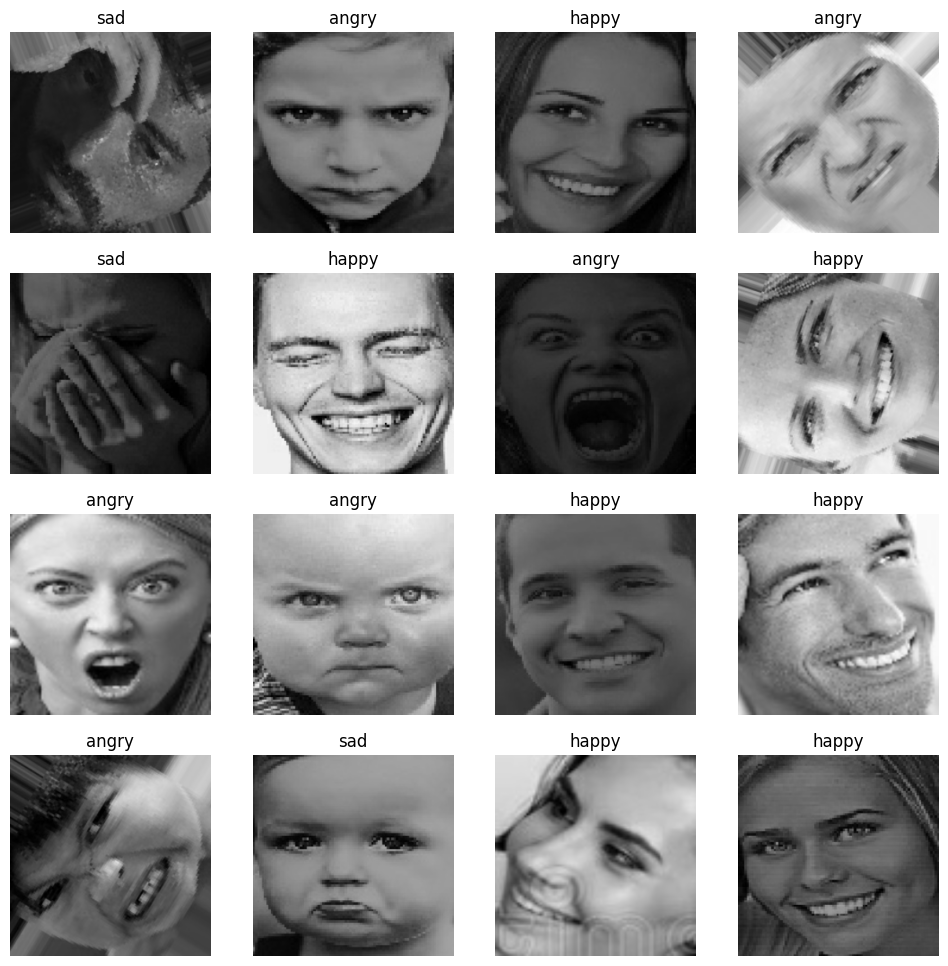

In [7]:
plt.figure(figsize =(12,12))

for images, labels in train_dataset.take(1):
  for i in range(16):
    ax = plt.subplot(4,4, i+1)
    plt.imshow(images[i]/255.0)
    plt.title(CLASS_NAMES[tf.argmax(labels.numpy()[i])])
    plt.axis('off')

In [8]:
# Data Augmentation

from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomContrast

augment_layers = tf.keras.Sequential([
    RandomRotation(factor = (-0.025, 0.025)),
    RandomFlip(mode='horizontal'),
    RandomContrast(factor=0.1)
    ]
)

def augment_layer(image, label):
  return augment_layers(image, training=True), label

In [9]:
training_dataset = (train_dataset
                    .map(augment_layer, num_parallel_calls = tf.data.AUTOTUNE)
                    .prefetch(tf.data.AUTOTUNE))
validation_dataset = val_dataset.prefetch(tf.data.AUTOTUNE)

In [10]:
from tensorflow.keras.layers import Rescaling, Resizing

resize_rescale_layers = tf.keras.Sequential([
    Resizing(CONFIGURATIONS['IM_SIZE'], CONFIGURATIONS['IM_SIZE']),
    Rescaling(1.0/255.0)
])

### EfficientNet Model

In [11]:
EfficeintNetB4 = tf.keras.applications.efficientnet.EfficientNetB4(
    include_top=False,
    weights='imagenet',
    input_shape=(CONFIGURATIONS['IM_SIZE'], CONFIGURATIONS['IM_SIZE'],3)
)

71686520/71686520 [==============================] - 1s 0us/step


In [12]:
EfficeintNetB4.trainable = False

In [13]:
EfficeintNetB4_TF = tf.keras.Sequential([
    Input(shape = (CONFIGURATIONS['IM_SIZE'], CONFIGURATIONS['IM_SIZE'],3)),
    EfficeintNetB4,
    GlobalAveragePooling2D(),
    Dense(CONFIGURATIONS['N_DENSE_1'], activation = 'relu'),
    BatchNormalization(),
    Dense(CONFIGURATIONS['N_DENSE_2'], activation ='relu'),
    Dense(CONFIGURATIONS['NUM_CLASSES'], activation ='softmax')
])

In [14]:
EfficeintNetB4_TF.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb4 (Functional  (None, 8, 8, 1792)        17673823  
 )                                                               
                                                                 
 global_average_pooling2d (  (None, 1792)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 1024)              1836032   
                                                                 
 batch_normalization (Batch  (None, 1024)              4096      
 Normalization)                                                  
                                                                 
 dense_1 (Dense)             (None, 128)               131200    
                                                      

### Training And Optimization

In [15]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import Precision, Recall, F1Score, AUC, CategoricalAccuracy, TopKCategoricalAccuracy
from tensorflow.keras.callbacks import CSVLogger, EarlyStopping, LearningRateScheduler, ModelCheckpoint, ReduceLROnPlateau

In [16]:
METRICS = [Precision(name ='precision'), Recall(name ='recall'), AUC(name ='auc'), CategoricalAccuracy(name ='accuracy'),
           TopKCategoricalAccuracy(k=2, name ='topk_accuracy')]

loss_function = CategoricalCrossentropy()

In [17]:
EfficeintNetB4_TF.compile(optimizer=Adam(learning_rate=CONFIGURATIONS['LEARNING_RATE']), loss=loss_function, metrics = METRICS)

In [19]:
# csv logger
working_direc = working_direc + 'EfficientNetB4/'
path = working_direc + 'EfficientNetB4_model_logs.csv'
csv_callback = CSVLogger(path, separator = ',', append = True)

# tensorboard callback
import datetime
current_time = datetime.datetime.now().strftime('%d%m%y - %h%m%s')

LOG_DIR = working_direc + 'logs/' + current_time
METRIC_DIR = LOG_DIR + '/metrics'
train_writer = tf.summary.create_file_writer(METRIC_DIR)

tensorboard_Callback = tf.keras.callbacks.TensorBoard(log_dir = LOG_DIR)

# early stopping
es_callback = EarlyStopping(
    monitor = 'val_loss',
    min_delta = 0,
    patience = 10,
    verbose = 1,
    mode = 'auto',
    restore_best_weights = True
)


# learning rate scheduling
def scheduler(epoch, lr):

  if epoch <= 5:
    learning_rate = lr
  else:
    learning_rate = lr * tf.math.exp(-0.1)
    learning_rate = learning_rate.numpy()

  with train_writer.as_default():
    tf.summary.scalar('Learning Rate', data = learning_rate, step = epoch)
  return learning_rate
scheduler_callback = LearningRateScheduler(scheduler, verbose = 1)

# reduce learning rate on plateau
plateau_callback = ReduceLROnPlateau(
    monitor = 'val_accuracy', factor =0.1, patience =5, verbose =1
)

# model checkpointing
location = working_direc + 'model_checkpoint/'
checkpoint_callback = ModelCheckpoint(
    location,
    monitor = 'val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=False,
    mode ='auto',
    save_freq='epoch'
)

In [20]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '/device:GPU:0'

In [21]:
model_training = EfficeintNetB4_TF.fit(training_dataset, validation_data=validation_dataset, epochs=CONFIGURATIONS['N_EPOCH'], verbose=1
                               ,callbacks=[tensorboard_Callback, csv_callback, es_callback, scheduler_callback, checkpoint_callback, plateau_callback])


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/30
213/213 [==============================] - ETA: 0s - loss: 0.8386 - precision: 0.7059 - recall: 0.6547 - auc: 0.8548 - accuracy: 0.6845 - topk_accuracy: 0.9001
Epoch 1: val_loss improved from inf to 0.71188, saving model to /content/drive/MyDrive/Human-Emotion-Detection/EfficientNetB4/EfficientNetB4/model_checkpoint/
213/213 [==============================] - 1185s 5s/step - loss: 0.8386 - precision: 0.7059 - recall: 0.6547 - auc: 0.8548 - accuracy: 0.6845 - topk_accuracy: 0.9001 - val_loss: 0.7119 - val_precision: 0.7464 - val_recall: 0.7015 - val_auc: 0.8876 - val_accuracy: 0.7248 - val_topk_accuracy: 0.9008 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/30
213/213 [==============================] - ETA: 0s - loss: 0.5828 - precision: 0.7910 - recall: 0.7244 - auc: 0.9133 - accuracy: 0.7579 - topk_accuracy: 0.9300
Epoch 2: val_loss improved 

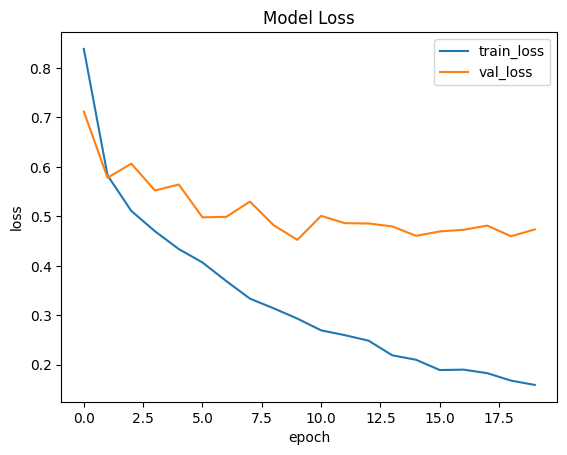

In [22]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(model_training.history['loss'])
plt.plot(model_training.history['val_loss'])
plt.xlabel('epoch')
plt.ylabel('loss')
plt.title('Model Loss')
plt.legend(['train_loss', 'val_loss'])

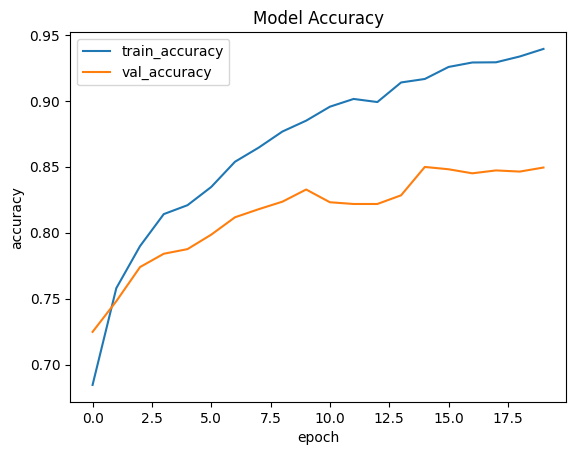

In [23]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(model_training.history['accuracy'])
plt.plot(model_training.history['val_accuracy'])
plt.xlabel('epoch')
plt.ylabel('accuracy')
plt.title('Model Accuracy')
plt.legend(['train_accuracy', 'val_accuracy'])

In [24]:
save_model_path = working_direc + 'EfficientNetB4_Model_seq.keras'
EfficeintNetB4_TF.save(save_model_path)

In [25]:
%load_ext tensorboard

In [32]:
tensorboard --logdir=/content/drive/MyDrive/Human-Emotion-Detection/EfficientNetB4/logs/

Reusing TensorBoard on port 6006 (pid 20944), started 0:01:07 ago. (Use '!kill 20944' to kill it.)

<IPython.core.display.Javascript object>

### Evaluation and Testing

In [27]:
EfficeintNetB4_TF.evaluate(validation_dataset)

72/72 [==============================] - 15s 198ms/step - loss: 0.4525 - precision: 0.8500 - recall: 0.8134 - auc: 0.9514 - accuracy: 0.8327 - topk_accuracy: 0.9508


[0.4524936378002167,
 0.8500000238418579,
 0.8134328126907349,
 0.9514151811599731,
 0.8327479958534241,
 0.9508340358734131]

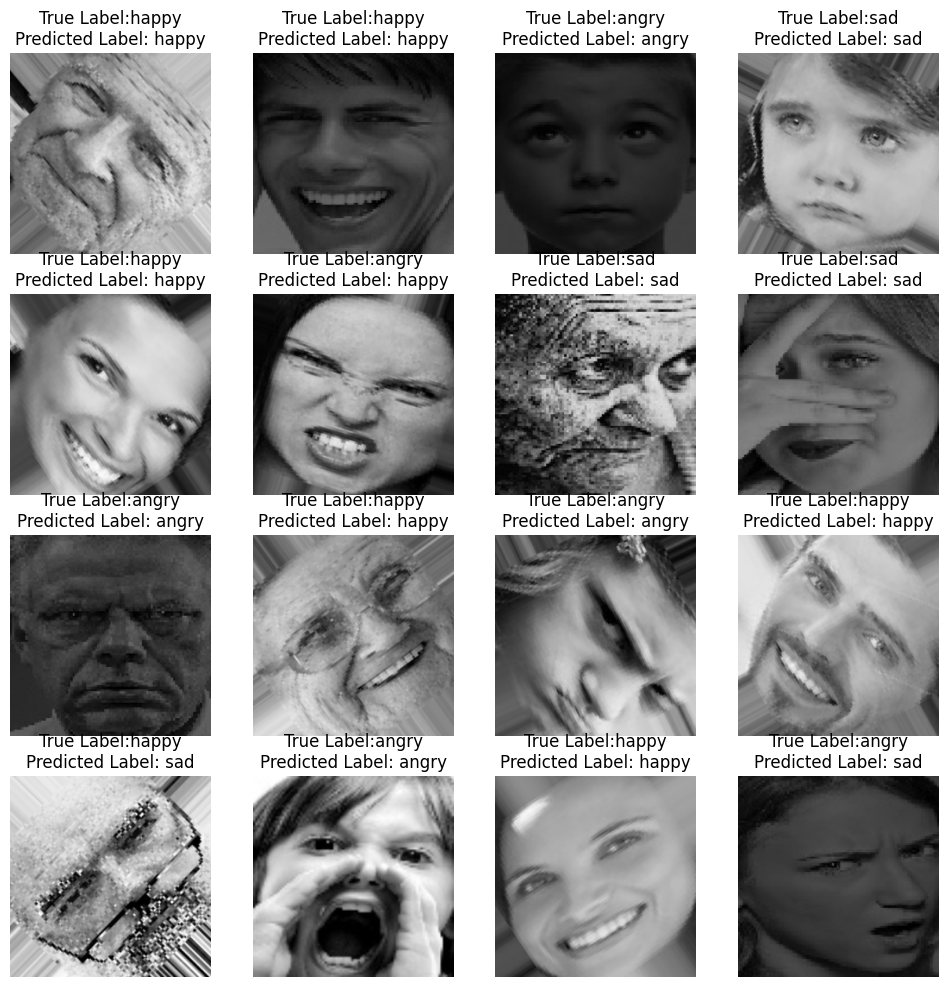

In [28]:
plt.figure(figsize =(12,12))

for images, labels in validation_dataset.take(1):
  for i in range(16):
    ax = plt.subplot(4,4, i+1)
    plt.imshow(images[i]/255.0)
    plt.title('True Label:' + CLASS_NAMES[tf.argmax(labels.numpy()[i])] + '\n' +
              'Predicted Label: ' + CLASS_NAMES[tf.argmax(EfficeintNetB4_TF(tf.expand_dims(images[i], axis =0)), axis =-1).numpy()[0]])
    plt.axis('off')

#### Metrics

In [29]:
import numpy as np
predictions = []
labels = []

for im, label in validation_dataset:
  predictions.append(EfficeintNetB4_TF(im))
  labels.append(label.numpy())

preds = np.concatenate([np.argmax(predictions[:-1], axis = -1).flatten(), np.argmax(predictions[-1], axis = -1).flatten()])
true_labels = np.concatenate([np.argmax(labels[:-1], axis = -1).flatten(), np.argmax(predictions[-1], axis = -1).flatten()])

[[372  64  79]
 [ 36 916  55]
 [ 58  88 610]]


Text(0.5, 14.722222222222216, 'Predicted')

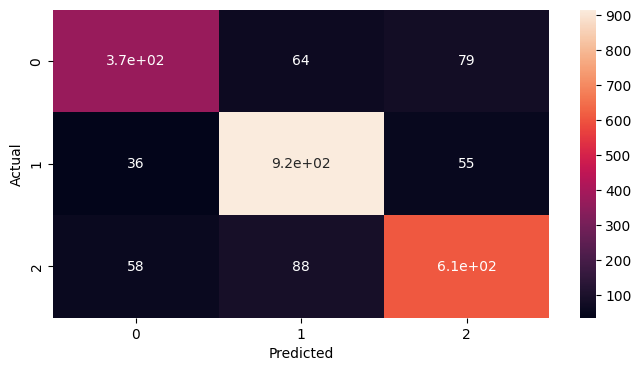

In [30]:
# confusion matrix
from sklearn.metrics import confusion_matrix, f1_score
import seaborn as sns

conf = confusion_matrix(true_labels, preds)

print(conf)

plt.figure(figsize = (8,4))
sns.heatmap(conf, annot=True)
plt.ylabel('Actual')
plt.xlabel('Predicted')

In [31]:
f1_score(true_labels, preds, average='micro')

0.8331870061457419